<a href="https://colab.research.google.com/github/w15d0177/AIFFEL_project/blob/main/Computer_Vision/cv_project_2_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **✅ 1. Faster RCNN**

In [41]:
# 필요한 라이브러리 가져오기
!pip3 install tensorflow-estimator==2.6.0

In [42]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [43]:
# 이미지를 시각화하는 함수
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [44]:
# 원하는 이미지를 다운로드하고 정해진 가로, 세로 길이에 맞게 이미지를 resizing하는 함수
def download_and_resize_image(url, new_width=256, new_height=256, display=False):

  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  #pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.Resampling.LANCZOS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [45]:
# bounding box를 만드는 함수
def draw_bounding_box_on_image(image,
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):

  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]

  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height

  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [46]:
# 이미지 위에 class 이름과 score를 나타내는 함수
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to /tmp/tmpu_m9mekg.jpg.


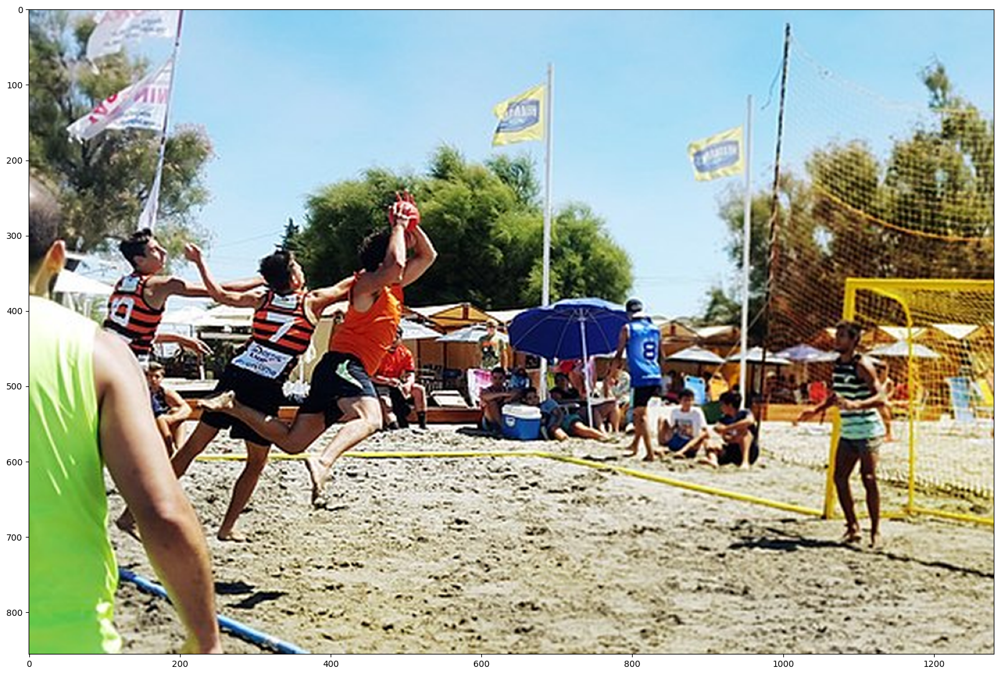

In [47]:
# 이미지 데이터 가져오기
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

In [49]:
# tfhub에서 사전 학습된(Pre-trained) InceptionResnet 모델을 사용한 Faster RCNN 모델 불러오기
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

In [50]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [52]:
# detector를 실행하는 함수
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

In [53]:
!pip install --upgrade pillow

In [55]:
import tensorflow as tf
import tensorflow_hub as hub

import time
from PIL import Image, ImageDraw, ImageFont
import numpy as np

# ... (rest of your code)

def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  # **Modified to use font.getbbox instead of font.getsize**
  display_str_heights = [font.getbbox(ds)[3] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.

  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getbbox(display_str)[2:] # Use getbbox for width and height
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

# ... (rest of your code)

Found 100 objects.
Inference time:  39.92028450965881


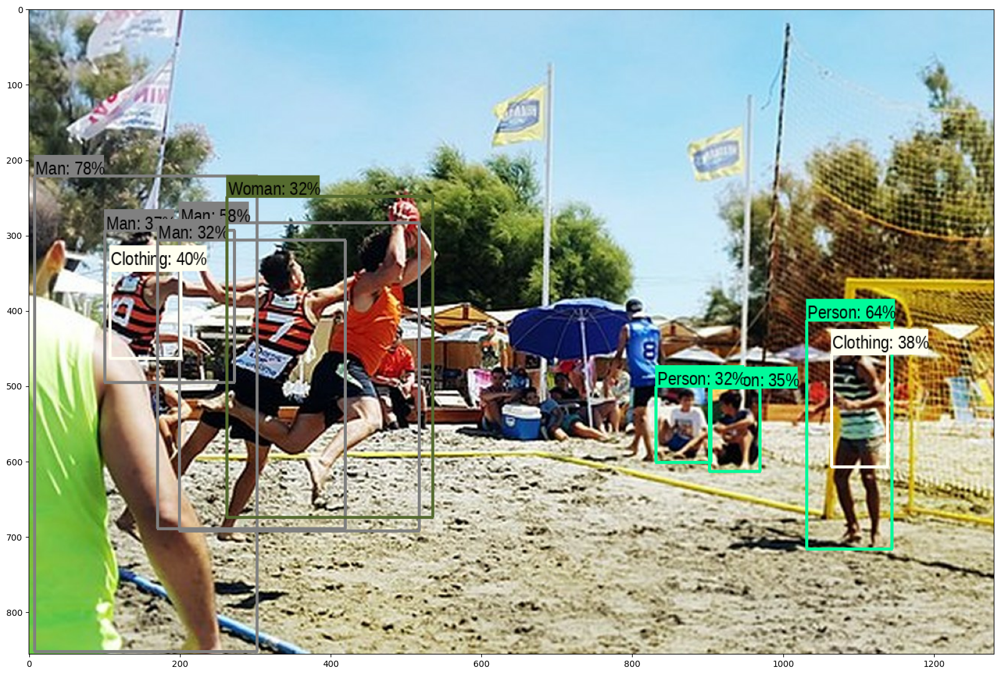

In [56]:
# detector 실행
run_detector(detector, downloaded_image_path)

# **✅ 2-1. 다른 이미지 테스트해보기**

Image downloaded to /tmp/tmp6ejbr09l.jpg.


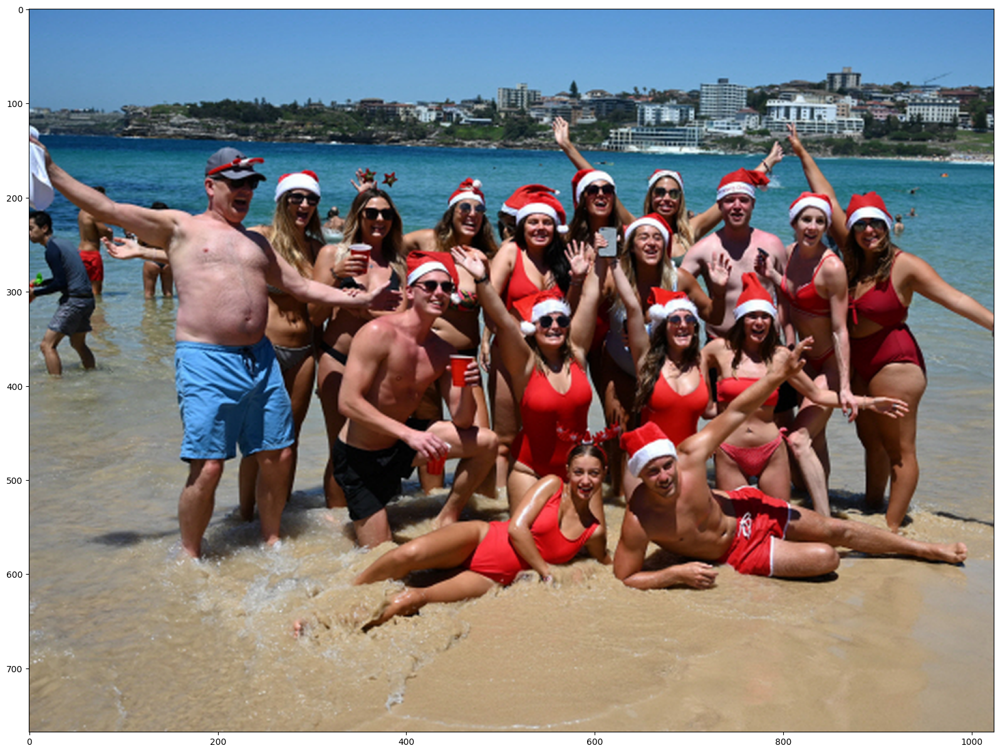

In [57]:
# 이미지 불러오기
image_url = "https://image.edaily.co.kr/images/photo/files/NP/S/2018/12/PS18122500251.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1024, 768, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  32.28320288658142


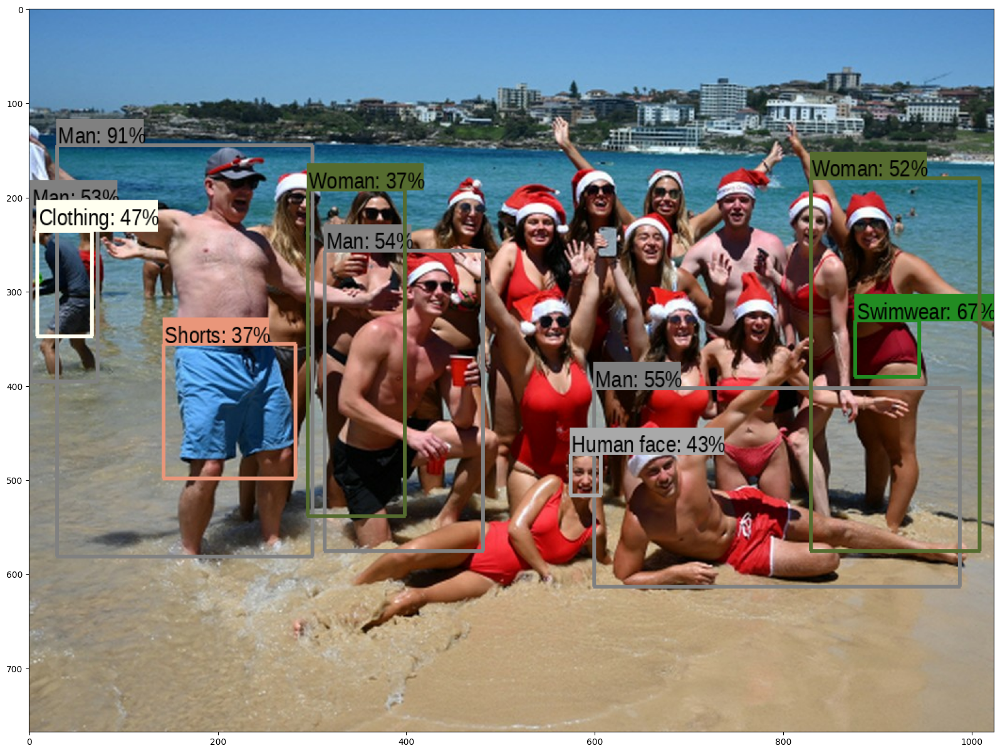

In [58]:
run_detector(detector, downloaded_image_path)

# **✅ 2-2. 다양한 pre-trained model 테스트해보기**

## **(1) YOLO-V8**

In [3]:
!pip install ultralytics
from ultralytics import YOLO

# Load a pre-trained model from Ultralytics hub
# Change from "ultralytics/yolov8" to "yolov8n-cls"
# This tells the YOLO class to download the yolov8n-cls model
# from the Ultralytics hub if it's not already available locally

model = YOLO("yolov8n-cls")




0: 224x224 radio 0.12, cassette 0.09, safe 0.08, tape_player 0.07, oscilloscope 0.07, 88.7ms
Speed: 15.1ms preprocess, 88.7ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


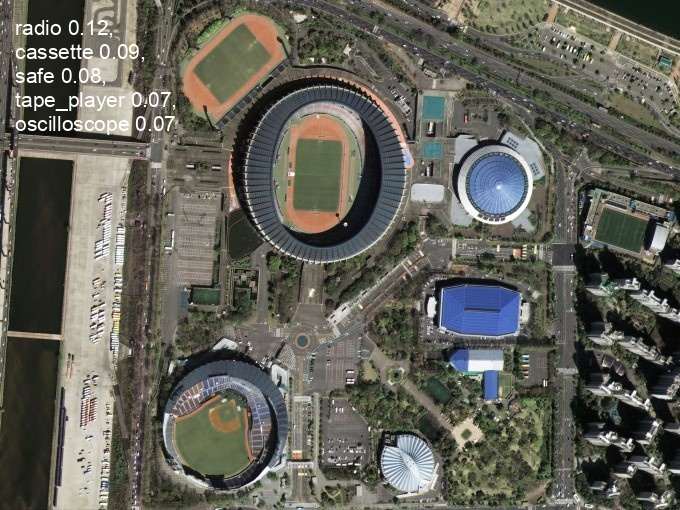

In [4]:
from PIL import Image
import requests
from io import BytesIO

# Load a satellite image from URL
response = requests.get('http://image.dongascience.com/Photo/2021/05/45b5d8882896be992d710608af2f58f4.jpg', stream=True)
response.raise_for_status()  # Raise an exception for bad responses (4xx or 5xx)
img = Image.open(BytesIO(response.content))

# Perform inference on the image
results = model(img)

# Visualize detection results
results[0].plot()

# Save the results as an annotated image
results[0].save("output_image.jpg")

# show the output file
from IPython.display import Image
Image("output_image.jpg")


0: 224x224 syringe 0.97, hammer 0.01, rule 0.00, rubber_eraser 0.00, pole 0.00, 31.3ms
Speed: 8.0ms preprocess, 31.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


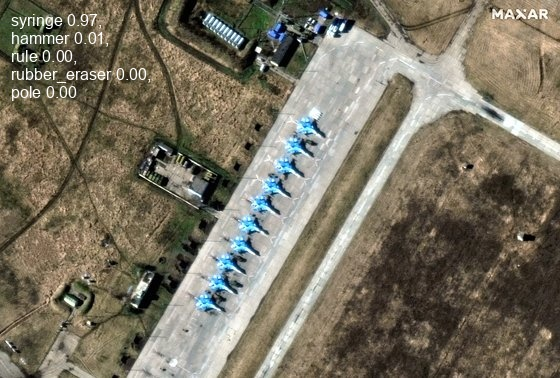

In [8]:
from PIL import Image
import requests
from io import BytesIO

# Load a satellite image from URL
response = requests.get('https://pds.joongang.co.kr/news/component/htmlphoto_mmdata/202203/14/66ea24a4-207d-4f5b-881f-bbda38433ae9.jpg', stream=True)
response.raise_for_status()  # Raise an exception for bad responses (4xx or 5xx)
img = Image.open(BytesIO(response.content))

# Perform inference on the image
results = model(img)

# Visualize detection results
results[0].plot()

# Save the results as an annotated image
results[0].save("output_image.jpg")

# show the output file
from IPython.display import Image
Image("output_image.jpg")

## **(4) 결론**

안타깝게도, YOLO 버전 8 모델은 위의 위성 사진에서는 개체들을 탐지하는 데 좋은 성능을 보이지 못했다.  